In [36]:
import os, sys
from torchvision.models.vgg import vgg19
import torch
from  sporco.signal import tikhonov_filter
import numpy as np
import pywt
import matplotlib.pyplot as plt
from imageio import imread
from imageio import imsave
from scipy import linalg as la
import warnings 
warnings.filterwarnings('ignore')

In [37]:
def signaltonoise(a, axis, ddof):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m / sd)


def lowpass(s, lda, npad):  # In this function, low pass filtering is done by using Tikhonov filter.
    return tikhonov_filter(s, lda, npad)


In [38]:
def get_activation(model, layer_numbers, input_image):
    outs = []
    out = input_image
    for i in range(max(layer_numbers) + 1):
        with torch.no_grad():  # Reduces memory usage and speeds up calculations
            out = model.features[i](out)
        if i in layer_numbers:
            outs.append(np.rollaxis(out.detach().cpu().numpy()[0], 0, 3))
    return outs


def c3(s):  # Picture 3D is turned into array and rotate.
    if s.ndim == 2:
        s3 = np.dstack([s, s, s])
    else:
        s3 = s
    return np.rollaxis(s3, 2, 0)[None, :, :, :]


In [39]:
def l1_features(out):
    h, w, d = out.shape  # The shape property used to get the current shape of an array (height, width, depth)
    a_temp = np.zeros((h + 2, w + 2))  # All edges of the Matrix have been zero

    l1_norm = np.sum(np.abs(out), axis=2)
    a_temp[1:h + 1, 1:w + 1] = l1_norm
    return a_temp


In [40]:

def Fusion_PCA(image1, image2):
    # Converting Image data to numpy Array to be able to do necessary calculation
    a = np.array(image1)
    b = np.array(image2)
    # getting Image dimensions
    temp1 = a.shape
    temp2 = b.shape
    # Starting PCA algorithm
    # creating matrix with both Images
    vector1 = np.reshape(a, temp1[0] * temp1[1], order='F')
    vector2 = np.reshape(b, temp2[0] * temp2[1], order='F')
    # Convolution of created matrix
    c = np.cov(vector1, vector2)
    # getting Eigenvalue and Eigenvector of this matrix
    d, v = la.eig(c)
    sum1 = np.sum(v, axis=0)
    # Calculating PCA
    if d[0] >= d[1]:
        pca = np.divide(v[:, 0], sum1[0])
    else:
        pca = np.divide(v[:, 1], sum1[1])
    # Creating fused image
    result = (pca[0] * image1) + (pca[1] * image2)
    return result


In [41]:
def Fusion_DWT_db2(image1, image2):
    # decomposing each image using Discrete wavelet transform(DWT) with Daubechies filter (db2)
    coefficients_1 = pywt.wavedec2(image1, 'db2', level=2)
    coefficients_2 = pywt.wavedec2(image2, 'db2', level=2)
    # creating variables to be used
    coefficients_h = list(coefficients_1)
    # fusing the decomposed image data
    coefficients_h[0] = (coefficients_1[0] + coefficients_2[0]) * 0.5
    # creating variables to be used
    temp1 = list(coefficients_1[1])
    temp2 = list(coefficients_2[1])
    temp3 = list(coefficients_h[1])
    # fusing the decomposed image data
    temp3[0] = (temp1[0] + temp2[0]) * 0.5
    temp3[1] = (temp1[1] + temp2[1]) * 0.5
    temp3[2] = (temp1[2] + temp2[2]) * 0.5
    coefficients_h[1] = tuple(temp3)
    # Creating fused image by reconstructing the fused decomposed image
    result = pywt.waverec2(coefficients_h, 'db2')
    return result

In [42]:

def fusion_strategy(feat_a, feat_b, source_a, source_b, img, unit):  # weighted-averaging method
    m, n = feat_a.shape
    m1, n1 = source_a.shape[:2]
    weight_ave_temp1 = np.zeros((m1, n1))
    weight_ave_temp2 = np.zeros((m1, n1))
    weight_ave_temp3 = np.zeros((m1, n1))

    for i in range(1, m):
        for j in range(1, n):
            a1 = feat_a[i - 1:i + 1, j - 1:j + 1].sum() / 9
            a2 = feat_b[i - 1:i + 1, j - 1:j + 1].sum() / 9
            a3 = img[i - 1:i + 1, j - 1:j + 1].sum() / 9

            weight_ave_temp1[(i - 2) * unit + 1:(i - 1) * unit + 1, (j - 2) * unit + 1:(j - 1) * unit + 1] = a1 / (
                    a1 + a2 + a3)
            weight_ave_temp2[(i - 2) * unit + 1:(i - 1) * unit + 1, (j - 2) * unit + 1:(j - 1) * unit + 1] = a2 / (
                    a1 + a2 + a3)
            weight_ave_temp3[(i - 2) * unit + 1:(i - 1) * unit + 1, (j - 2) * unit + 1:(j - 1) * unit + 1] = a3 / (
                    a1 + a2 + a3)

    if source_a.ndim == 3:
        weight_ave_temp1 = weight_ave_temp1[:, :, None]
    source_a_fuse = source_a * weight_ave_temp1
    if source_b.ndim == 3:
        weight_ave_temp2 = weight_ave_temp2[:, :, None]
    source_b_fuse = source_b * weight_ave_temp2
    if img.ndim == 3:
        weight_ave_temp3 = weight_ave_temp3[:, :, None]
    source_img_fuse = img * weight_ave_temp3

    if source_a.ndim == 3 or source_b.ndim == 3 or img.ndim == 3:
        gen = np.atleast_3d(source_a_fuse) + np.atleast_3d(source_b_fuse) + np.atleast_3d(source_img_fuse)
    else:
        gen = source_a_fuse + source_b_fuse + source_img_fuse

    return gen


In [43]:

def fusion_strategy2(feat_a, feat_b, source_a, source_b, img1, img2, unit):
    m, n = feat_a.shape
    m1, n1 = source_a.shape[:2]
    weight_ave_temp1 = np.zeros((m1, n1))
    weight_ave_temp2 = np.zeros((m1, n1))
    weight_ave_temp3 = np.zeros((m1, n1))
    weight_ave_temp4 = np.zeros((m1, n1))

    for i in range(1, m):
        for j in range(1, n):
            a1 = feat_a[i - 1:i + 1, j - 1:j + 1].sum() / 9
            a2 = feat_b[i - 1:i + 1, j - 1:j + 1].sum() / 9
            a3 = img1[i - 1:i + 1, j - 1:j + 1].sum() / 9
            a4 = img2[i - 1:i + 1, j - 1:j + 1].sum() / 9

            weight_ave_temp1[(i - 2) * unit + 1:(i - 1) * unit + 1, (j - 2) * unit + 1:(j - 1) * unit + 1] = a1 / (
                    a1 + a2 + a3 + a4)
            weight_ave_temp2[(i - 2) * unit + 1:(i - 1) * unit + 1, (j - 2) * unit + 1:(j - 1) * unit + 1] = a2 / (
                    a1 + a2 + a3 + a4)
            weight_ave_temp3[(i - 2) * unit + 1:(i - 1) * unit + 1, (j - 2) * unit + 1:(j - 1) * unit + 1] = a3 / (
                    a1 + a2 + a3 + a4)
            weight_ave_temp4[(i - 2) * unit + 1:(i - 1) * unit + 1, (j - 2) * unit + 1:(j - 1) * unit + 1] = a4 / (
                    a1 + a2 + a3 + a4)

    if source_a.ndim == 3:
        weight_ave_temp1 = weight_ave_temp1[:, :, None]
    source_a_fuse = source_a * weight_ave_temp1
    if source_b.ndim == 3:
        weight_ave_temp2 = weight_ave_temp2[:, :, None]
    source_b_fuse = source_b * weight_ave_temp2
    if img1.ndim == 3:
        weight_ave_temp3 = weight_ave_temp3[:, :, None]
    source_img_fuse = img1 * weight_ave_temp3
    if img2.ndim == 3:
        weight_ave_temp4 = weight_ave_temp4[:, :, None]
    source_img2_fuse = img2 * weight_ave_temp4

    if source_a.ndim == 3 or source_b.ndim == 3 or img1.ndim == 3 or img2.ndim == 3:
        gen = np.atleast_3d(source_a_fuse) + np.atleast_3d(source_b_fuse) + np.atleast_3d(
            source_img_fuse) + np.atleast_3d(source_img2_fuse)
    else:
        gen = source_a_fuse + source_b_fuse + source_img_fuse + source_img2_fuse

    return gen



In [44]:

def fuse(vis, ir, model=None):
    npad = 16
    lda = 5
    vis_low, vis_high = lowpass(vis.astype(np.float32) / 255, lda, npad)
    ir_low, ir_high = lowpass(ir.astype(np.float32) / 255, lda, npad)

    img = Fusion_DWT_db2(vis.astype(np.float32) / 255, ir_high)
    img1 = Fusion_PCA(ir.astype(np.float32) / 255, ir_high)
    img2 = Fusion_PCA(vis_high, vis.astype(np.float32) / 255)
    snr = np.max(signaltonoise(img, axis=0, ddof=0))

    if model is None:
        model = vgg19(True)
    model.cpu().eval()
    relus = [2, 7, 12, 21]
    unit_relus = [1, 2, 4, 8]

    vis_in = torch.from_numpy(c3(vis_high)).cpu()
    ir_in = torch.from_numpy(c3(ir_high)).cpu()

    relus_vis = get_activation(model, relus, vis_in)
    relus_ir = get_activation(model, relus, ir_in)

    vis_feats = [l1_features(out) for out in relus_vis]
    ir_feats = [l1_features(out) for out in relus_ir]

    saliencies = []
    saliency_max = None

    if 10 < snr < 19:
        for idx in range(len(relus)):
            saliency_current = fusion_strategy(vis_feats[idx], ir_feats[idx],
                                               vis_high, ir_high, img, unit_relus[idx])
            saliencies.append(saliency_current)

            if saliency_max is None:
                saliency_max = saliency_current
            else:
                saliency_max = np.maximum(saliency_max, saliency_current)

    else:
        for idx in range(len(relus)):
            saliency_current = fusion_strategy2(vis_feats[idx], ir_feats[idx],
                                                vis_high, ir_high, img1, img2, unit_relus[idx])
            saliencies.append(saliency_current)

            if saliency_max is None:
                saliency_max = saliency_current
            else:
                saliency_max = np.maximum(saliency_max, saliency_current)

    if vis_low.ndim == 3 or ir_low.ndim == 3:
        low_fused = np.atleast_3d(vis_low) + np.atleast_3d(ir_low)
    else:
        low_fused = vis_low + ir_low
    low_fused = low_fused / 2
    high_fused = saliency_max

    return np.clip((low_fused + high_fused),0,1)

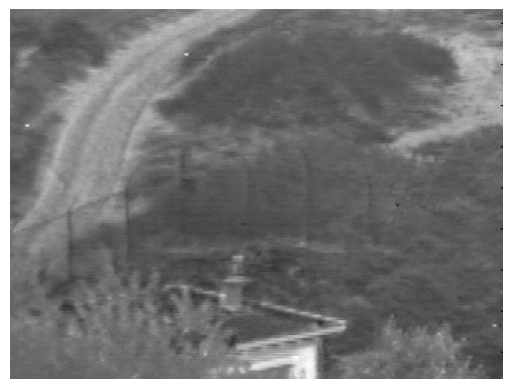

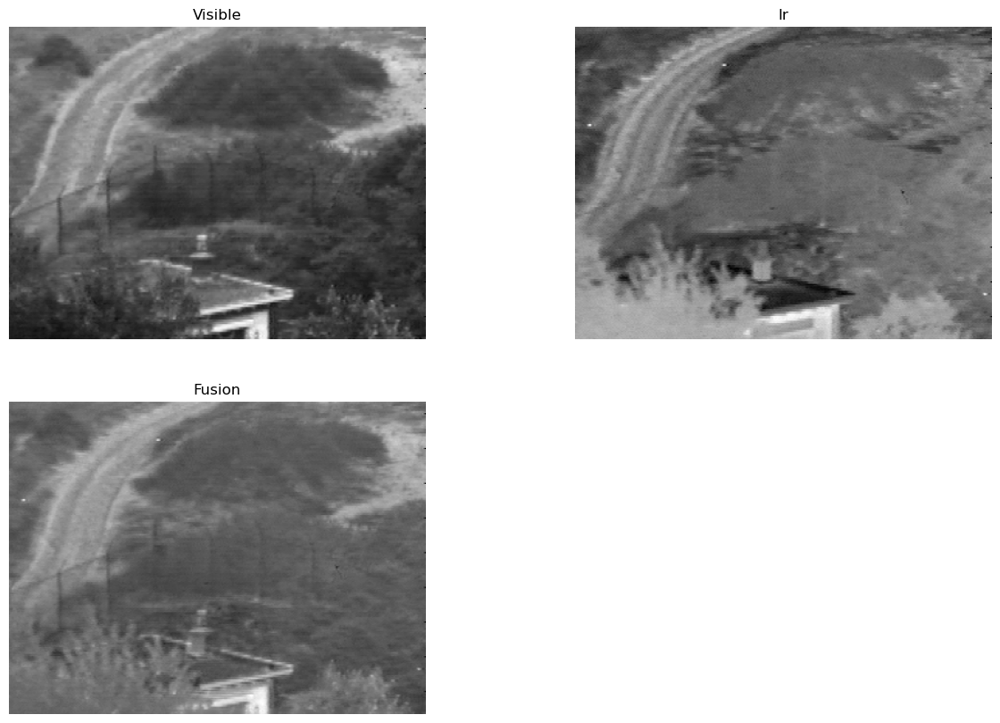

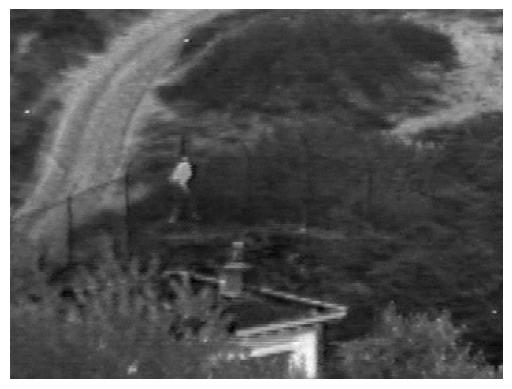

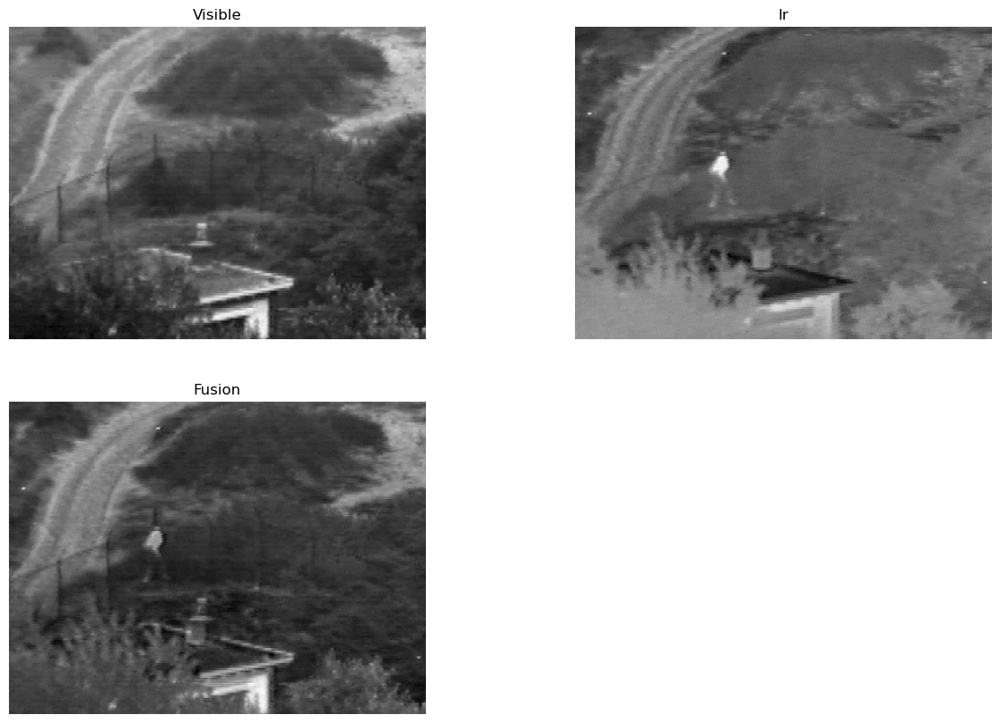

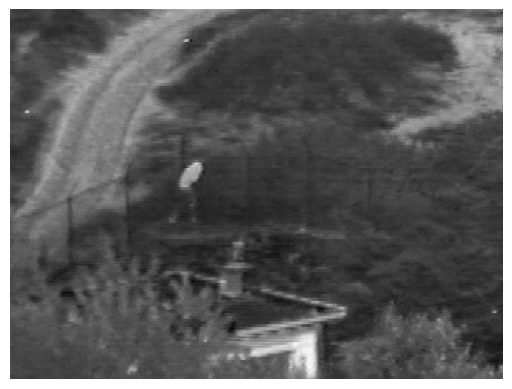

...

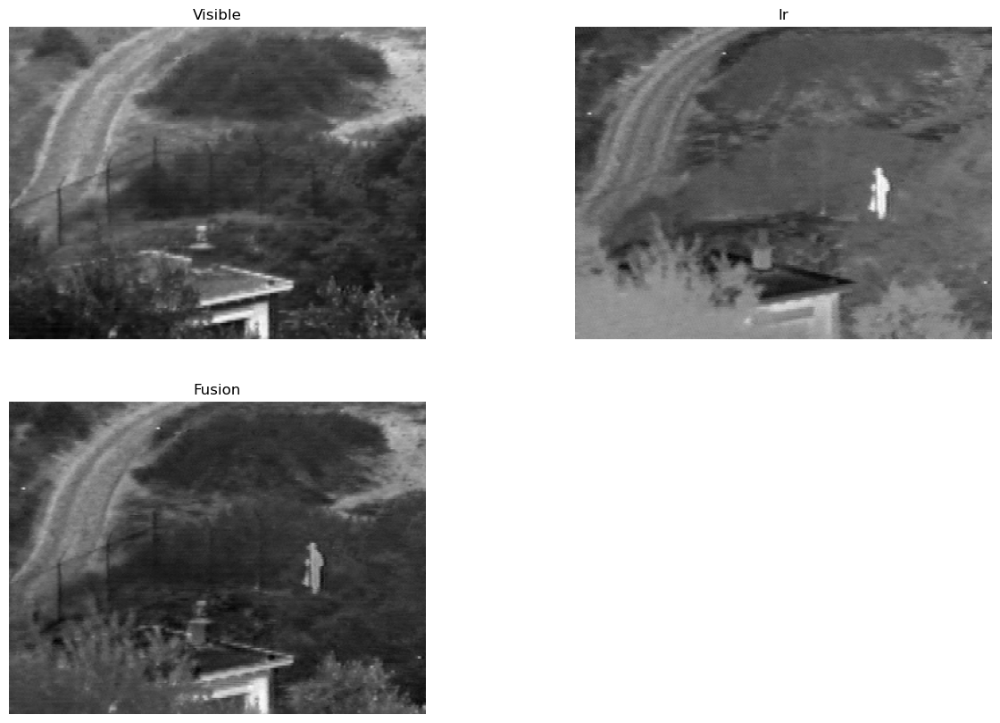

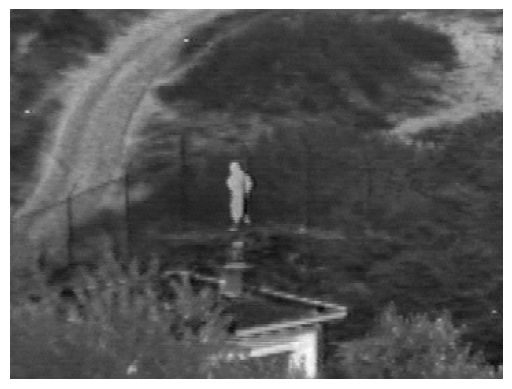

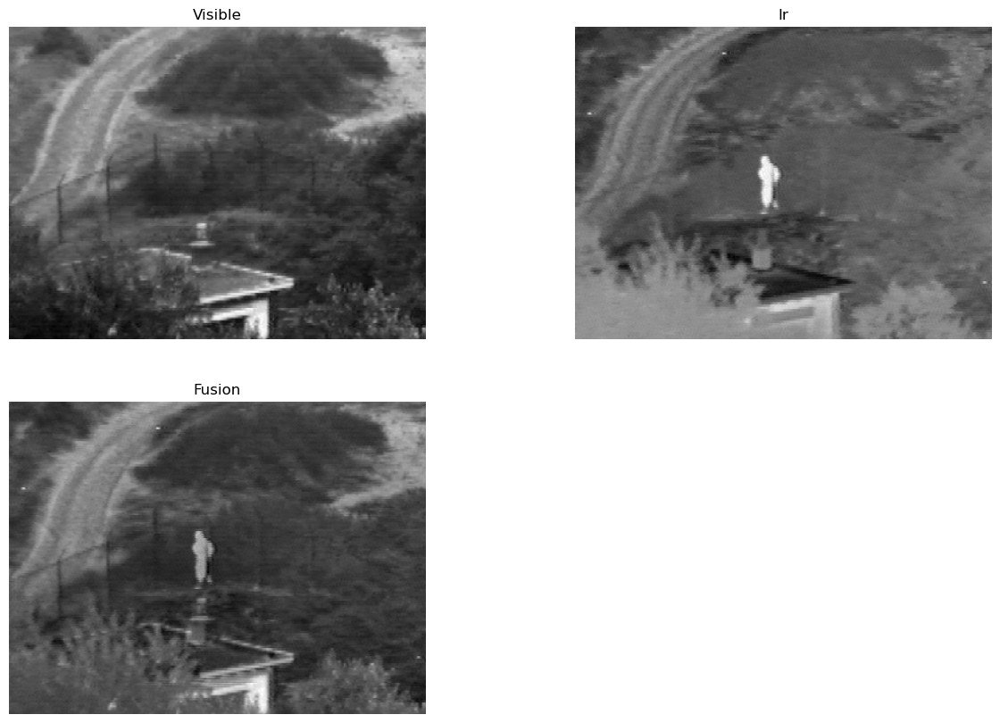

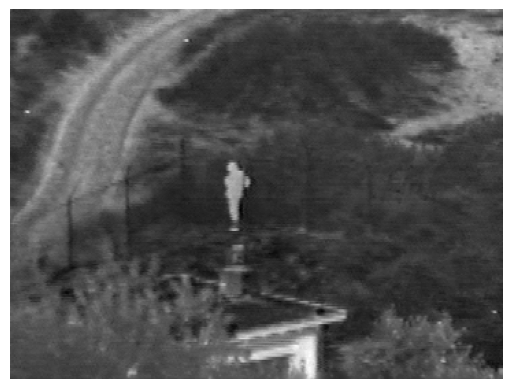

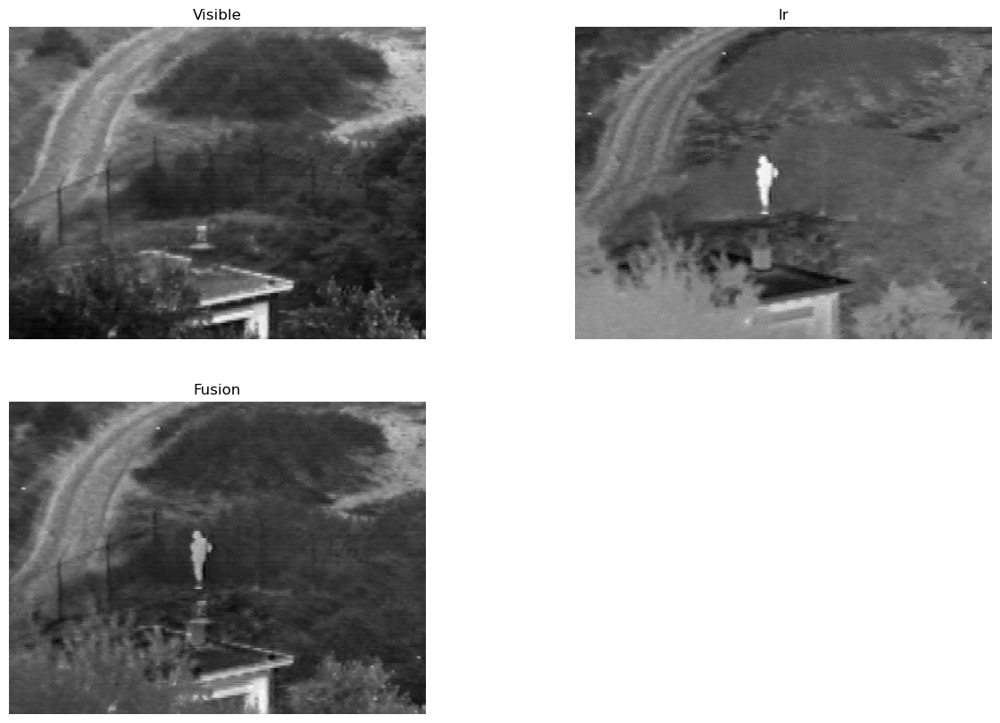

In [45]:
# id_x for selecting image, you can change manually 1 to 21 (21 different infrared and 21 different visible image)
for id_x in range(1, 22, 1):

    gray_img = imread('Nato/visual/%dv.bmp' % id_x)
    ir_img = imread('Nato/thermal/%di.bmp' % id_x)

    pic = fuse(gray_img, ir_img)

    plt.imshow(pic, 'gray')
    plt.axis('off')

    pict = pic * 255
    pict = pict.astype(np.uint8)
    imsave("Nato/fused_image/fused%d.png" % id_x, pict)

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 2, 1)
    plt.imshow(gray_img, 'gray')
    plt.axis('off')
    plt.title('Visible')

    plt.subplot(2, 2, 2)
    plt.imshow(ir_img, 'gray')
    plt.axis('off')
    plt.title('Ir')

    plt.subplot(2, 2, 3)
    plt.imshow(pic, 'gray')
    plt.axis('off')
    plt.title('Fusion')
    plt.show()